In [244]:
import torch.nn as nn
import torch
torch.autograd.set_detect_anomaly(True)

In [281]:
import torchvision.datasets as datasets
from torch.utils.data import DataLoader, Subset
import torchvision.transforms as transforms

dataset_storage_directory = './mnist_dataset'
image_resolution = (28, 28)

mnist_dataset = datasets.MNIST(
    root=dataset_storage_directory,
    train=True,
    transform=transforms.Compose([
        transforms.Resize(image_resolution),
        transforms.ToTensor()
    ]),
    download=True
)
from torch.utils.data import DataLoader

batch_size = 64
indices_of_digit_1 = [i for i, label in enumerate(mnist_dataset.targets) if label == 1]

# Create a subset of the dataset for digit '1' only
#mnist_dataset = Subset(mnist_dataset, indices_of_digit_1)
dataloader = DataLoader(mnist_dataset, batch_size=batch_size, shuffle=True, drop_last=True)


In [282]:
class Generator(nn.Module):
  def __init__(self, input_dim, output_dim):
    super(Generator, self).__init__()
    self.input_layer = nn.Linear(input_dim, 256)
    self.batch_norm1 = nn.BatchNorm1d(256)
    self.relu1 = nn.LeakyReLU()
    self.hidden_layer_1 = nn.Linear(256, 256)
    self.batch_norm2 = nn.BatchNorm1d(256)
    self.relu2 = nn.LeakyReLU()
    self.hidden_layer_2 = nn.Linear(256, 512)
    self.batch_norm3 = nn.BatchNorm1d(512)
    self.relu3 = nn.LeakyReLU()
    self.hidden_layer_3 = nn.Linear(512, 1024)
    self.batch_norm4 = nn.BatchNorm1d(1024)
    self.relu4 = nn.LeakyReLU()
    self.hidden_layer_4 = nn.Linear(1024, 2048)
    self.batch_norm5 = nn.BatchNorm1d(2048)
    self.relu5 = nn.LeakyReLU()
    self.hidden_layer_5 = nn.Linear(2048, 1024)
    self.batch_norm6 = nn.BatchNorm1d(1024)
    self.relu6 = nn.LeakyReLU()
    self.hidden_layer_6 = nn.Linear(1024, output_dim)
    self.sigmoid = nn.Sigmoid()
  def forward(self, x, apply_sigmoid=False):
    x = self.input_layer(x)
    x = self.batch_norm1(x)
    x = self.relu1(x)
    x = self.hidden_layer_1(x)
    x = self.batch_norm2(x)
    x = self.relu2(x)
    x = self.hidden_layer_2(x)
    x = self.batch_norm3(x)
    x = self.relu3(x)
    x = self.hidden_layer_3(x)
    x = self.batch_norm4(x)
    x = self.relu4(x)
    x = self.hidden_layer_4(x)
    x = self.batch_norm5(x)
    x = self.relu5(x)
    x = self.hidden_layer_5(x)
    x = self.batch_norm6(x)
    x = self.relu6(x)
    x = self.hidden_layer_6(x)
    if apply_sigmoid:
      x = self.sigmoid(x)
    return x
class Discriminator(nn.Module):
  def __init__(self, input_dim, output_dim=1):
    super(Discriminator, self).__init__()
    self.input_layer = nn.Linear(input_dim, 256)
    self.relu1 = nn.ReLU()
    self.hidden_layer_1 = nn.Linear(256, 512)
    self.relu2 = nn.ReLU()
    self.hidden_layer_2 = nn.Linear(512, 512)
    # # self.batch_norm = nn.BatchNorm1d(512)
    self.dropout = nn.Dropout(p=0.5)
    self.relu3 = nn.ReLU()
    self.hidden_layer_3 = nn.Linear(512, output_dim)
    # self.sigmoid = nn.Sigmoid()
  def forward(self, x):
    x = self.input_layer(x)
    x = self.relu1(x)
    x = self.hidden_layer_1(x)
    # x = self.batch_norm(x)
    x = self.relu2(x)
    x = self.dropout(x)
    x = self.hidden_layer_2(x)
    x = self.relu3(x)
    x = self.hidden_layer_3(x)
    return x

In [288]:
# def fake_loss(fake_image_discrimination):
#     gan_score = torch.log(1 - fake_image_discrimination)
#     gan_score = -1 * gan_score
#     return gan_score.mean()

# def real_loss(real_image_discrimination):
#     gan_score = torch.log(fake_image_discrimination)
#     gan_score = -1 * gan_score
#     return gan_score.mean()
def discrim_loss_func(real_image_discrimination, fake_image_discrimination):
    gan_score = torch.log(fake_image_discrimination) + torch.log(1 - real_image_discrimination)
    return gan_score.mean()

def discriminator_loss_func(real_image_discrimination, fake_image_discrimination):
    #print(real_image_discrimination, fake_image_discrimination)
    #real_targets = torch.ones_like(real_image_discrimination)
    real_targets = torch.full_like(real_image_discrimination, 0.9)
    #fake_targets = torch.zeros_like(fake_image_discrimination
    fake_targets = torch.zeros_like(fake_image_discrimination)
    # real_loss = torch.nn.functional.binary_cross_entropy(real_image_discrimination, real_targets)
    # fake_loss = torch.nn.functional.binary_cross_entropy(fake_image_discrimination, fake_targets)
    real_loss = torch.nn.functional.binary_cross_entropy_with_logits(real_image_discrimination, real_targets)
    fake_loss = torch.nn.functional.binary_cross_entropy_with_logits(fake_image_discrimination, fake_targets)

    return real_loss + fake_loss
def generator_loss_func(fake_image_discrimination):
    gan_score = torch.log(fake_image_discrimination)
    gan_score = -1 * gan_score
    return gan_score.mean()
def generator_loss_func(fake_image_discrimination):
    #return torch.nn.functional.binary_cross_entropy(fake_image_discrimination, torch.ones_like(fake_image_discrimination))
    #return torch.nn.functional.binary_cross_entropy_with_logits(fake_image_discrimination, torch.ones_like(fake_image_discrimination))
    return torch.nn.functional.binary_cross_entropy_with_logits(fake_image_discrimination, torch.full_like(fake_image_discrimination, 1))
EPOCHS = 30
generator = Generator(100, 784).cuda()
discriminator = Discriminator(784, 1).cuda()
def weights_init(module):
    if isinstance(module, nn.Linear):
        nn.init.normal_(module.weight, 0.0, 0.02)
        if module.bias is not None:
            nn.init.constant_(module.bias, 0)

generator.apply(weights_init)
discriminator.apply(weights_init)
from tqdm.notebook import tqdm
#optimizer = torch.optim.Adam(list(generator.parameters()) + list(discriminator.parameters()), lr=0.03)
disc_optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.0002)
gen_optimizer = torch.optim.Adam(generator.parameters(), lr=0.0001)
for i in range(0, EPOCHS):
  for real_images_batch, _ in tqdm(dataloader, desc=f"Epoch {i+1}"):
    real_images_batch = real_images_batch.cuda()
    real_images_batch = real_images_batch.float()
    real_images_batch = torch.flatten(real_images_batch, start_dim=1)
    for _ in range(1):
        fake_images_noise_batch = torch.randn(batch_size, 100).cuda()
        with torch.no_grad():
            generated_fake_images = generator(fake_images_noise_batch).detach()
        real_image_discrimination = discriminator(real_images_batch)
        fake_image_discrimination = discriminator(generated_fake_images)
        # fake_loss = fake_loss(fake_image_discrimination)
        # real_loss = real_loss(real_image_discrimination)
        discrim_loss = discriminator_loss_func(real_image_discrimination, fake_image_discrimination)
        #loss = gan_loss_function(fake_image_discrimination, real_image_discrimination)
        #optimizer.zero_grad()
        disc_optimizer.zero_grad()
        discrim_loss.backward()
        disc_optimizer.step()

    for _ in range(2):
        fake_images_noise_batch = torch.randn(batch_size, 100).cuda()
        generated_fake_images = generator(fake_images_noise_batch)
        fake_image_discrimination = discriminator(generated_fake_images)
        generator_loss = generator_loss_func(fake_image_discrimination)
        gen_optimizer.zero_grad()
        generator_loss.backward()
        # fake_loss.backward()
        # real_loss.backward()
        print(generator_loss, discrim_loss)
        gen_optimizer.step()
        #optimizer.step()

Epoch 1:   0%|          | 0/937 [00:00<?, ?it/s]

tensor(0.6982, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3878, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.6950, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3878, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.6987, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3853, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.6968, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3853, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7007, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3843, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.6991, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3843, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7036, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3822, device='cuda:0', grad_fn=<AddBack

Epoch 2:   0%|          | 0/937 [00:00<?, ?it/s]

tensor(0.7103, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3345, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7164, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3345, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.6597, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3231, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7188, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3231, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.6963, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.2785, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7981, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.2785, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7824, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.2083, device='cuda:0', grad_fn=<AddBack

Epoch 3:   0%|          | 0/937 [00:00<?, ?it/s]

tensor(1.0798, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.1832, device='cuda:0', grad_fn=<AddBackward0>)
tensor(1.1196, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.1832, device='cuda:0', grad_fn=<AddBackward0>)
tensor(1.1807, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3045, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.9689, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3045, device='cuda:0', grad_fn=<AddBackward0>)
tensor(1.1072, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.4107, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.9865, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.4107, device='cuda:0', grad_fn=<AddBackward0>)
tensor(1.0314, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3078, device='cuda:0', grad_fn=<AddBack

Epoch 4:   0%|          | 0/937 [00:00<?, ?it/s]

tensor(1.0164, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.2411, device='cuda:0', grad_fn=<AddBackward0>)
tensor(1.0141, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.2411, device='cuda:0', grad_fn=<AddBackward0>)
tensor(1.0175, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.1963, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.9938, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.1963, device='cuda:0', grad_fn=<AddBackward0>)
tensor(1.0196, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.2305, device='cuda:0', grad_fn=<AddBackward0>)
tensor(1.0129, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.2305, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.9722, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.2375, device='cuda:0', grad_fn=<AddBack

Epoch 5:   0%|          | 0/937 [00:00<?, ?it/s]

tensor(0.8664, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3114, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8794, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3114, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8705, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3105, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8433, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3105, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8469, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.2935, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8604, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.2935, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.9062, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.2575, device='cuda:0', grad_fn=<AddBack

Epoch 6:   0%|          | 0/937 [00:00<?, ?it/s]

tensor(0.7757, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3919, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7833, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3919, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7761, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3758, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7757, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3758, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7842, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.4014, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7766, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.4014, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7721, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3742, device='cuda:0', grad_fn=<AddBack

Epoch 7:   0%|          | 0/937 [00:00<?, ?it/s]

tensor(0.8095, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3598, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8045, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3598, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8057, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3728, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8074, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3728, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7993, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3756, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7881, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3756, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7949, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3744, device='cuda:0', grad_fn=<AddBack

Epoch 8:   0%|          | 0/937 [00:00<?, ?it/s]

tensor(0.7860, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3754, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7854, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3754, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7865, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3790, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7868, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3790, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7855, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3699, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7868, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3699, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7848, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3875, device='cuda:0', grad_fn=<AddBack

Epoch 9:   0%|          | 0/937 [00:00<?, ?it/s]

tensor(0.8085, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3760, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8063, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3760, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8116, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3759, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8053, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3759, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8131, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3781, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8054, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3781, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8036, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3764, device='cuda:0', grad_fn=<AddBack

Epoch 10:   0%|          | 0/937 [00:00<?, ?it/s]

tensor(0.8052, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3415, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8045, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3415, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8016, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3449, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7969, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3449, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8119, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3403, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7918, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3403, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8132, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3648, device='cuda:0', grad_fn=<AddBack

Epoch 11:   0%|          | 0/937 [00:00<?, ?it/s]

tensor(0.8359, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.4060, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8113, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.4060, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8497, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.4004, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8137, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.4004, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8501, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3608, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8572, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3608, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8927, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3743, device='cuda:0', grad_fn=<AddBack

Epoch 12:   0%|          | 0/937 [00:00<?, ?it/s]

tensor(0.7982, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.4120, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8111, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.4120, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8729, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3652, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8413, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3652, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.9126, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3764, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8894, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3764, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.9601, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3812, device='cuda:0', grad_fn=<AddBack

Epoch 13:   0%|          | 0/937 [00:00<?, ?it/s]

tensor(0.8072, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3799, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8006, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3799, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8165, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3955, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8059, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3955, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8119, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3831, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8168, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3831, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8177, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3826, device='cuda:0', grad_fn=<AddBack

Epoch 14:   0%|          | 0/937 [00:00<?, ?it/s]

tensor(0.7811, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3426, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8149, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3426, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7775, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.4176, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7820, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.4176, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7724, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3851, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7755, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3851, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8062, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.4143, device='cuda:0', grad_fn=<AddBack

Epoch 15:   0%|          | 0/937 [00:00<?, ?it/s]

tensor(0.8302, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3873, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8283, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3873, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8148, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3781, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8215, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3781, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8310, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3814, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8237, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3814, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8138, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3857, device='cuda:0', grad_fn=<AddBack

Epoch 16:   0%|          | 0/937 [00:00<?, ?it/s]

tensor(0.8529, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3679, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8551, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3679, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8407, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3666, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8413, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3666, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8548, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3346, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8416, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3346, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8411, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3393, device='cuda:0', grad_fn=<AddBack

Epoch 17:   0%|          | 0/937 [00:00<?, ?it/s]

tensor(0.8132, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3956, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7924, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3956, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8028, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3954, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7887, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3954, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8113, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3878, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8118, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3878, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8017, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3608, device='cuda:0', grad_fn=<AddBack

Epoch 18:   0%|          | 0/937 [00:00<?, ?it/s]

tensor(0.8146, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3779, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8132, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3779, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8321, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3822, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8087, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3822, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8258, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3741, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8125, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3741, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8212, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3700, device='cuda:0', grad_fn=<AddBack

Epoch 19:   0%|          | 0/937 [00:00<?, ?it/s]

tensor(0.7897, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3855, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7901, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3855, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7887, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3843, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7891, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3843, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7923, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3838, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7876, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3838, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7908, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3800, device='cuda:0', grad_fn=<AddBack

Epoch 20:   0%|          | 0/937 [00:00<?, ?it/s]

tensor(0.7865, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3735, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7864, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3735, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7915, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3819, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7863, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3819, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7862, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3768, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7875, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3768, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7796, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3781, device='cuda:0', grad_fn=<AddBack

Epoch 21:   0%|          | 0/937 [00:00<?, ?it/s]

tensor(0.8414, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3443, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8398, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3443, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8384, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3547, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8667, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3547, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8477, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3327, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8320, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3327, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8589, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3579, device='cuda:0', grad_fn=<AddBack

Epoch 22:   0%|          | 0/937 [00:00<?, ?it/s]

tensor(0.7259, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.5770, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7175, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.5770, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7618, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.5605, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7672, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.5605, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7996, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.5864, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7632, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.5864, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7779, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.5734, device='cuda:0', grad_fn=<AddBack

Epoch 23:   0%|          | 0/937 [00:00<?, ?it/s]

tensor(0.8178, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3772, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8053, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3772, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8212, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3779, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8248, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3779, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8232, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3643, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8239, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3643, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8150, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3786, device='cuda:0', grad_fn=<AddBack

Epoch 24:   0%|          | 0/937 [00:00<?, ?it/s]

tensor(0.7807, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3711, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7820, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3711, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7882, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3682, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7841, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3682, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7892, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3725, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7802, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3725, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7923, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3806, device='cuda:0', grad_fn=<AddBack

Epoch 25:   0%|          | 0/937 [00:00<?, ?it/s]

tensor(0.8126, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3783, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8073, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3783, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8165, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3676, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8095, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3676, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8085, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3702, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8093, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3702, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8092, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3723, device='cuda:0', grad_fn=<AddBack

Epoch 26:   0%|          | 0/937 [00:00<?, ?it/s]

tensor(0.8171, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3832, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8102, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3832, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8240, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3893, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8135, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3893, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8149, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3764, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8025, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3764, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8144, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3691, device='cuda:0', grad_fn=<AddBack

Epoch 27:   0%|          | 0/937 [00:00<?, ?it/s]

tensor(0.8905, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3614, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8743, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3614, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8489, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3863, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8708, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3863, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8636, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3850, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8465, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3850, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8785, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3495, device='cuda:0', grad_fn=<AddBack

Epoch 28:   0%|          | 0/937 [00:00<?, ?it/s]

tensor(0.8504, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3704, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8382, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3704, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8570, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3082, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8356, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3082, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8443, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3630, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8451, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3630, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8832, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3805, device='cuda:0', grad_fn=<AddBack

Epoch 29:   0%|          | 0/937 [00:00<?, ?it/s]

tensor(0.8452, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3617, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8543, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3617, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8461, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3389, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8336, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3389, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8238, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3469, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8330, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3469, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8396, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3721, device='cuda:0', grad_fn=<AddBack

Epoch 30:   0%|          | 0/937 [00:00<?, ?it/s]

tensor(0.8240, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3698, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8248, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3698, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8309, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3602, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8200, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3602, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8143, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3506, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8160, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3506, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8178, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3535, device='cuda:0', grad_fn=<AddBack

In [289]:
z1 = torch.randn(64, 100).cuda()
z2 = torch.randn(64, 100).cuda()
out1 = generator(z1, apply_sigmoid=True)
out2 = generator(z2, apply_sigmoid=True)
print(torch.norm(out1 - out2))

tensor(22.2289, device='cuda:0', grad_fn=<LinalgVectorNormBackward0>)


tensor([[-0.5272,  1.7239,  1.2952,  ...,  0.0845, -0.0183, -0.5751],
        [ 0.4314, -0.6069,  0.2126,  ..., -0.2401,  0.2140,  0.3169],
        [ 2.3585,  0.2560,  1.2208,  ..., -0.1857, -1.1240,  0.0226],
        ...,
        [ 0.3159,  0.7682,  0.5410,  ...,  0.1754, -1.0100,  0.9398],
        [-1.0180,  0.6443,  0.3698,  ..., -1.3430,  0.3631, -0.4385],
        [ 0.7234, -0.1299,  0.6391,  ..., -0.2306,  0.5235, -0.5269]],
       device='cuda:0')
[[0.3759084  0.5984796  0.55967546 0.4360224  0.54110366 0.5275167
  0.5259601  0.5567324  0.50733364 0.63537365 0.60706204 0.4641181
  0.5266244  0.4816146  0.55814034 0.5683405  0.5307771  0.45019066
  0.49110973 0.48490644 0.52287024 0.41631693 0.5394708  0.50828356
  0.5360734  0.46944165 0.4383302  0.50741893]
 [0.41946605 0.4636907  0.5553965  0.65213937 0.3886204  0.52951944
  0.47044784 0.35542315 0.43973145 0.5493986  0.44252628 0.50685036
  0.48412243 0.50762874 0.40157944 0.5793061  0.52545184 0.5765121
  0.52505964 0.3644532

<Figure size 640x480 with 0 Axes>

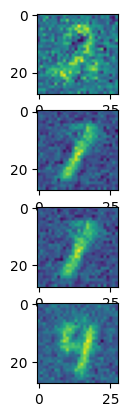

In [290]:
random_noise = torch.randn(64, 100).cuda()
print(random_noise)
fake_images = generator(random_noise, apply_sigmoid=True)
import matplotlib.pyplot as plt
print(fake_images[0].cpu().view(28,28).detach().numpy())
plt.figure()

#subplot(r,c) provide the no. of rows and columns
f, axarr = plt.subplots(4,1)
axarr[0].imshow(fake_images[0].cpu().view(28,28).detach().numpy())
axarr[1].imshow(fake_images[1].cpu().view(28,28).detach().numpy())
axarr[2].imshow(fake_images[2].cpu().view(28,28).detach().numpy())
axarr[3].imshow(fake_images[3].cpu().view(28,28).detach().numpy())

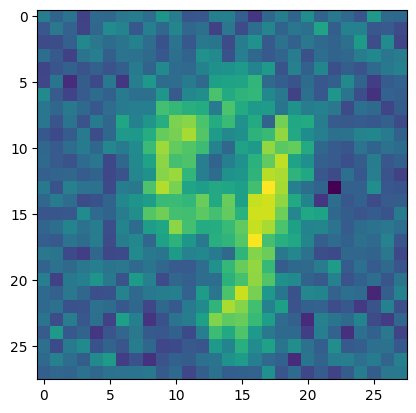

In [294]:
import matplotlib.pyplot as plt
plt.imshow(fake_images[10].cpu().view(28,28).detach().numpy())

In [295]:
discriminator(fake_images)

tensor([[-0.1976],
        [-0.8370],
        [-0.2369],
        [-0.6064],
        [-0.3390],
        [-0.4289],
        [-0.2866],
        [-0.3550],
        [-0.2534],
        [-0.4217],
        [-0.3625],
        [-0.2741],
        [-0.6878],
        [-0.2109],
        [-0.4095],
        [-0.5622],
        [-0.2764],
        [-0.2433],
        [-0.2227],
        [-0.5164],
        [-0.2801],
        [-0.7840],
        [-0.3645],
        [-0.4958],
        [-0.3936],
        [-0.3644],
        [-0.3171],
        [-0.2674],
        [-0.9673],
        [-0.7145],
        [-0.4384],
        [-0.3139],
        [-0.9511],
        [-0.2382],
        [-0.4982],
        [-0.2669],
        [-0.4392],
        [-0.2152],
        [-0.2725],
        [-0.2412],
        [-0.3947],
        [-0.3725],
        [-0.3990],
        [-0.8785],
        [-0.5574],
        [-0.6141],
        [-0.3273],
        [-0.2146],
        [-0.6126],
        [-0.5105],
        [-0.8252],
        [-0.3287],
        [-0.

In [296]:
discriminator(real_images_batch)

tensor([[-0.1917],
        [-0.1558],
        [-0.1334],
        [-0.2255],
        [-0.1934],
        [-0.1579],
        [-0.1778],
        [-0.1546],
        [-0.1819],
        [-0.2069],
        [-0.1960],
        [-0.2040],
        [-0.1954],
        [-0.1841],
        [-0.1877],
        [-0.1964],
        [-0.2057],
        [-0.1708],
        [-0.1441],
        [-0.1882],
        [-0.1810],
        [-0.1799],
        [-0.1871],
        [-0.2149],
        [-0.1799],
        [-0.1910],
        [-0.1811],
        [-0.1990],
        [-0.1321],
        [-0.1853],
        [-0.1883],
        [-0.1837],
        [-0.1770],
        [-0.1369],
        [-0.2177],
        [-0.1802],
        [-0.1737],
        [-0.1783],
        [-0.1808],
        [-0.1862],
        [-0.2293],
        [-0.1255],
        [-0.1956],
        [-0.1582],
        [-0.1845],
        [-0.1642],
        [-0.1011],
        [-0.1910],
        [-0.2081],
        [-0.2162],
        [-0.1786],
        [-0.1866],
        [-0.

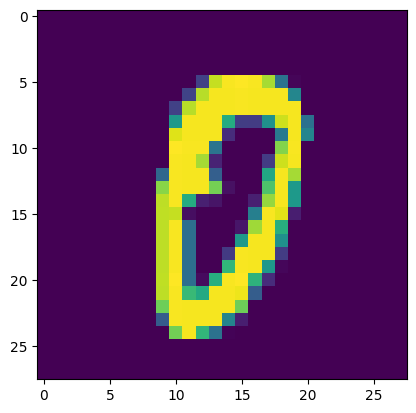

In [297]:
plt.imshow(real_images_batch[3].cpu().view(28,28).detach().numpy())

In [207]:
fake_images

tensor([[-2.6380e-04,  3.0969e-01,  4.9178e-02, -9.9666e-02, -1.0710e-01,
         -2.0845e-02, -1.8778e-01, -1.3405e-01,  1.9546e-01, -8.2217e-02,
          1.9925e-02, -1.4420e-01, -1.1873e-02,  1.4157e-02,  1.2275e-02,
          1.6401e-01, -3.0275e-02, -1.4585e-02,  3.6288e-02, -6.2536e-03,
         -2.0770e-02,  2.2714e-02, -1.0382e-02,  5.1561e-02,  2.5083e-02,
          6.1741e-02,  2.3672e-01, -3.6556e-02,  9.3411e-03,  1.9379e-02,
          1.1338e-01, -2.9353e-01, -1.2177e-02,  8.1017e-02, -2.8918e-02,
          1.1052e-01,  1.4369e-01, -2.2652e-02,  3.3090e-02,  1.1570e-01,
         -1.2840e-01,  1.7496e-02, -1.1618e-01,  6.6575e-02, -1.5959e-01,
          3.4487e-02,  8.8767e-02,  1.4464e-01, -1.5867e-01, -7.4282e-03,
         -4.0023e-03,  1.0963e-01, -1.5528e-01, -1.8090e-02, -2.3274e-03,
         -2.4251e-01,  1.5543e-01, -5.2449e-02,  1.0918e-01,  7.9559e-02,
         -1.2769e-01,  2.8001e-02,  6.6455e-02, -3.0793e-02,  4.3907e-02,
         -3.7824e-02,  4.0585e-02, -1.

In [188]:
real_images_batch[10].cpu().view(28,28).detach().numpy()

array([[0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.    